In [ ]:
# !pip install -q kaggle


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import os
os.environ['SNR_CONFIG_DIR'] = "/content/gdrive/My Drive/SNR20Z/"

In [ ]:
%cd /content/gdrive/My Drive/SNR20Z

/content/gdrive/.shortcut-targets-by-id/1s1gLRRbXGtcFoLYitMroorx8ZOd2EnnL/SNR20Z


In [ ]:
#cd /content/gdrive/MyDrive/SNR/
# from google.colab import files
# uploaded = files.upload()
# !kaggle datasets download -d jerzydziewierz/bee-vs-wasp
# !unzip \*.zip && rm *.zip

In [ ]:
%cd /content/gdrive/My Drive/SNR20Z/kaggle_bee_vs_wasp/

/content/gdrive/.shortcut-targets-by-id/1s1gLRRbXGtcFoLYitMroorx8ZOd2EnnL/SNR20Z/kaggle_bee_vs_wasp


# Wczytywanie danych

In [ ]:
import glob
for files in glob.glob("*.csv"):
    print(files) 

labels.csv


In [ ]:
import pandas as pd
df = pd.read_csv('labels.csv')
df.head()


,id,path,is_bee,is_wasp,is_otherinsect,is_other,photo_quality,is_validation,is_final_validation,label
0,1,bee1\10007154554_026417cfd0_n.jpg,1,0,0,0,1,0,0,bee
1,2,bee1\10024864894_6dc54d4b34_n.jpg,1,0,0,0,1,0,1,bee
2,3,bee1\10092043833_7306dfd1f0_n.jpg,1,0,0,0,1,1,0,bee
3,4,bee1\1011948979_fc3637e779_w.jpg,1,0,0,0,1,0,1,bee
4,5,bee1\10128235063_dca17db76c_n.jpg,1,0,0,0,1,0,0,bee


In [ ]:
import numpy as np
import tensorflow as tf
seed = 42
def seed_everything(seed):
    np.random.seed(seed)
    # os.environ['PYTHONHASHSEED'] = str(seed)
    # tf.random.set_seed(seed)
seed_everything(seed)

In [ ]:
from tqdm import tqdm
for idx in tqdm(df.index):    
    df.loc[idx,'path']=df.loc[idx,'path'].replace('\\', '/') 
    
df.head()

100%|██████████| 11421/11421 [00:06<00:00, 1712.96it/s]


,id,path,is_bee,is_wasp,is_otherinsect,is_other,photo_quality,is_validation,is_final_validation,label
0,1,bee1/10007154554_026417cfd0_n.jpg,1,0,0,0,1,0,0,bee
1,2,bee1/10024864894_6dc54d4b34_n.jpg,1,0,0,0,1,0,1,bee
2,3,bee1/10092043833_7306dfd1f0_n.jpg,1,0,0,0,1,1,0,bee
3,4,bee1/1011948979_fc3637e779_w.jpg,1,0,0,0,1,0,1,bee
4,5,bee1/10128235063_dca17db76c_n.jpg,1,0,0,0,1,0,0,bee


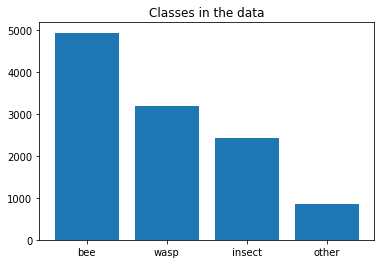

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os
import gc

import tensorflow as tf
from tensorflow.keras.layers import * 

labels = list(df['label'].unique())
label_cts = df['label'].value_counts()
x = range(0,len(label_cts))
plt.title('Classes in the data')
plt.bar(x, label_cts, tick_label=labels)
plt.show()

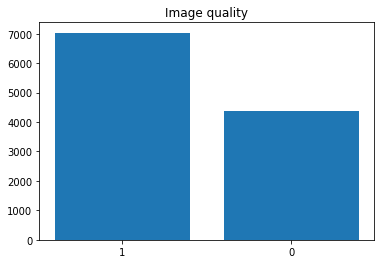

In [ ]:
qualities = list(df['photo_quality'].unique())
quality_cts = list(df['photo_quality'].value_counts())
x = range(0,len(quality_cts))
plt.bar(x, quality_cts, tick_label=qualities)
plt.title('Image quality')
plt.show()

In [ ]:
# df = df.query('photo_quality == 1').reset_index(drop=True)
# df['label'].value_counts()

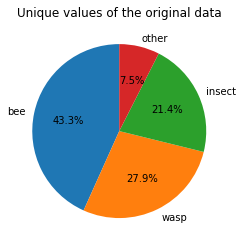

In [ ]:
import matplotlib.pyplot as plt
labels = list(df['label'].unique())
y = list(df['label'].value_counts())
plt.pie(y, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Unique values of the original data')
plt.show()

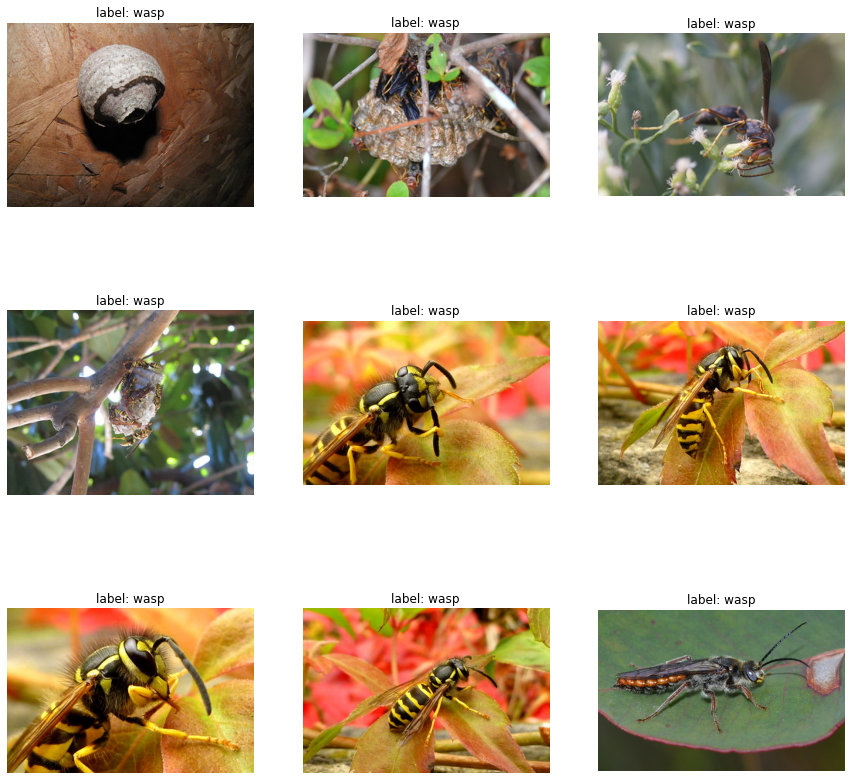

In [ ]:
import cv2
def img_plot(df, label):
    df = df.query('label == @label')
    imgs = []
    for path in df['path'][:9]:
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        imgs.append(img)
    f, ax = plt.subplots(3, 3, figsize=(15,15))
    for i, img in enumerate(imgs):
        ax[i//3, i%3].imshow(img)
        ax[i//3, i%3].axis('off')
        ax[i//3, i%3].set_title('label: %s' % label)
    plt.show()
    
    
img_plot(df, label='wasp')

In [ ]:
# select only high quality photos
# df = df.query('photo_quality == 1')
# df['label'].value_counts()

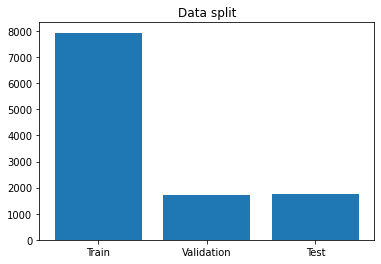

In [ ]:
train_df = df.query('is_validation == 0 & is_final_validation == 0').reset_index(drop=True)
val_df = df.query('is_validation == 1').reset_index(drop=True)
test_df = df.query('is_final_validation == 1').reset_index(drop=True)

data_split = [len(train_df.index), len(val_df.index), len(test_df.index)]
data_split_labels =['Train', 'Validation', 'Test']
x = range(0,len(data_split_labels))
plt.bar(x, data_split, tick_label=data_split_labels)
plt.title('Data split')
plt.show()

In [ ]:
classes = ['bee', 'insect', 'other', 'wasp']

In [ ]:
IMG_SIZE = 224
BATCH_SIZE = 64
EPOCHS = 15

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
trainAug = ImageDataGenerator(
  rescale=1./255,
	rotation_range=360,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True,
	fill_mode="nearest")

# initialize the validation/testing data augmentation object (which
# we'll be adding mean subtraction to)
valAug = ImageDataGenerator(  
  rescale=1./255
)

testAug = ImageDataGenerator(
		rescale=1./255
)

train_gen = trainAug.flow_from_dataframe(
    train_df, 
    directory=os.getcwd(), 
    x_col="path", y_col="label", target_size=(IMG_SIZE, IMG_SIZE), 
    color_mode="rgb", 
    classes = ['bee', 'insect', 'other', 'wasp'], class_mode = 'categorical',
    # class_mode="categorical", 
    batch_size=BATCH_SIZE, 
    shuffle=True,
)

valid_gen = valAug.flow_from_dataframe(
    val_df, 
    directory=os.getcwd(), 
    x_col="path", y_col="label", target_size=(IMG_SIZE, IMG_SIZE), 
    color_mode="rgb", 
    classes = ['bee', 'insect', 'other', 'wasp'], class_mode = 'categorical',

    # class_mode="categorical", 
    batch_size=BATCH_SIZE, 
    shuffle=False,
)

test_gen = testAug.flow_from_dataframe(
    test_df, 
    directory=os.getcwd(), 
    x_col="path", y_col="label", target_size=(IMG_SIZE, IMG_SIZE), 
    color_mode="rgb", 
    classes = ['bee', 'insect', 'other', 'wasp'], class_mode = 'categorical',

    # class_mode="categorical", 
    batch_size=BATCH_SIZE, 
    shuffle=False,
)

Found 7939 validated image filenames belonging to 4 classes.
Found 1719 validated image filenames belonging to 4 classes.
Found 1763 validated image filenames belonging to 4 classes.


In [ ]:
STEP_SIZE_TRAIN = train_gen.n//train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n//valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n//test_gen.batch_size

In [ ]:
class_names = train_gen.class_indices.keys()
print(classes)

['bee', 'insect', 'other', 'wasp']


In [ ]:
totalTest=test_gen.n

In [ ]:
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNet
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns


In [ ]:
def plot_training(history, epochs, plotPath):
	# construct a plot that plots and saves the training history
	plt.style.use("ggplot")
	plt.figure(figsize=(10,10))
	plt.plot(np.arange(0, epochs), history.history["loss"], label="train_loss")
	plt.plot(np.arange(0, epochs), history.history["val_loss"], label="val_loss")
	plt.plot(np.arange(0, epochs), history.history["accuracy"], label="train_acc")
	plt.plot(np.arange(0, epochs), history.history["val_accuracy"], label="val_acc")
	plt.title("MobileNet Training Loss and Accuracy")
	plt.xlabel("Epoch #")
	plt.ylabel("Loss/Accuracy")
	plt.legend(loc="lower left")
	plt.savefig(plotPath)

In [ ]:
def plot_confusion_matrix(model_name,testing_generator,predictions, normalize = True):
  cm = confusion_matrix(testing_generator.classes, predictions)
  if normalize:
      cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
      print("Normalized confusion matrix")
  else:
      print('Confusion matrix, without normalization')

  plt.figure(figsize=(5.5, 5.5))
  ax = sns.heatmap(cm, cmap=plt.cm.Greens, annot=True, square=True, 
                   xticklabels=testing_generator.class_indices.keys(), 
                   yticklabels=testing_generator.class_indices.keys())
  ax.set_ylabel('Actual', fontsize=13)
  ax.set_xlabel('Predicted', fontsize=13)
  plt.savefig('ConfMat' +model_name+ '.png', format='png')
  plt.show()

ZADANIE 1

**a**

In [ ]:
baseModel_0= MobileNet(weights='imagenet',include_top=False, input_shape=(224,224,3))
for layer in baseModel_0.layers:
  layer.trainable = False

headModel_0 = baseModel_0.output
headModel_0 = Flatten(name="flatten")(headModel_0)
headModel_0 = Dense(256, activation="relu")(headModel_0)
headModel_0 = Dropout(0.5)(headModel_0)
headModel_0 = Dense(4, activation="softmax")(headModel_0)

#model = mobile_model.layers[-3].output
#model = layers.GlobalAveragePooling2D()(model)
#model = layers.Dense(2, activation="softmax", kernel_initializer='uniform')(model)  
#model = Model(inputs=mobile_model.input, outputs=model)

model_0 = Model(inputs=baseModel_0.input, outputs=headModel_0)

In [ ]:
model_name_0 = 'MobileNet classification trained'

In [ ]:
lr = 0.01
opt = Adam(lr=lr, decay = lr/EPOCHS)
model_0.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

annealer_0 = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=2, verbose=1, min_lr=1e-5)
checkpoint_0 = ModelCheckpoint(model_name_0 + '.h5', verbose=1, save_best_only=True)
es_0 = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=EPOCHS/5)

In [ ]:
history_0 = model_0.fit(
    train_gen,
    steps_per_epoch=STEP_SIZE_TRAIN,
    validation_data=valid_gen,
    validation_steps=STEP_SIZE_VALID,
    epochs=EPOCHS,
    callbacks=[annealer_0,checkpoint_0,es_0]
)

Epoch 1/15
124/124 [==============================] - 112s 890ms/step - loss: 74.9949 - accuracy: 0.5247 - val_loss: 0.5079 - val_accuracy: 0.8227

Epoch 00001: val_loss improved from inf to 0.50787, saving model to MobileNet classification trained.h5
Epoch 2/15
124/124 [==============================] - 110s 890ms/step - loss: 0.9269 - accuracy: 0.6500 - val_loss: 0.4334 - val_accuracy: 0.8450

Epoch 00002: val_loss improved from 0.50787 to 0.43335, saving model to MobileNet classification trained.h5
Epoch 3/15
124/124 [==============================] - 110s 888ms/step - loss: 0.7891 - accuracy: 0.6717 - val_loss: 0.4062 - val_accuracy: 0.8462

Epoch 00003: val_loss improved from 0.43335 to 0.40616, saving model to MobileNet classification trained.h5
Epoch 4/15
124/124 [==============================] - 110s 889ms/step - loss: 0.7342 - accuracy: 0.6939 - val_loss: 0.3372 - val_accuracy: 0.8786

Epoch 00004: val_loss improved from 0.40616 to 0.33717, saving model to MobileNet classific

In [ ]:
np.save('history_' + model_name_0 + '.npy', history_0.history)

In [ ]:
history_0.history = np.load('history_' + model_name_0 + '.npy',allow_pickle=True)

AttributeError: ignored

In [ ]:
print(history_0)

{'loss': [21.537525177001953, 0.8989599347114563, 0.7881203889846802, 0.7372905611991882, 0.7136257290840149, 0.6235183477401733, 0.581694483757019, 0.5684516429901123, 0.5868865251541138, 0.5623331069946289, 0.49701040983200073, 0.5390896797180176, 0.5037705898284912], 'accuracy': [0.5998730063438416, 0.6593015789985657, 0.6742857098579407, 0.6990476250648499, 0.7193650603294373, 0.7714285850524902, 0.7770158648490906, 0.7846349477767944, 0.7715555429458618, 0.7906031608581543, 0.8134602904319763, 0.7818412780761719, 0.7987301349639893], 'val_loss': [0.5078737735748291, 0.43335115909576416, 0.4061591327190399, 0.33717048168182373, 0.30295777320861816, 0.30078116059303284, 0.3066679835319519, 0.28878164291381836, 0.32837021350860596, 0.25992971658706665, 0.26128679513931274, 0.2925245463848114, 0.2845619022846222], 'val_accuracy': [0.8227163553237915, 0.8449519276618958, 0.8461538553237915, 0.8786057829856873, 0.9026442170143127, 0.8990384340286255, 0.9098557829856873, 0.91105771064758

In [ ]:
del model_0
model_0 = load_model(model_name_0 + ".h5")

test_gen.reset()
predIdxs_0 = model_0.predict(x=test_gen,
	steps=(test_gen.n // test_gen.batch_size) + 1)
predIdxs_0 = np.argmax(predIdxs_0, axis=1)
print(classification_report(test_gen.classes, predIdxs_0,
	target_names=classes))
plot_training(history_0, 13, model_name_0 + '_plot.png')

              precision    recall  f1-score   support

         bee       0.94      0.90      0.92       504
      insect       0.92      0.83      0.87       376
       other       1.00      0.95      0.97       130
        wasp       0.87      0.94      0.90       753

    accuracy                           0.91      1763
   macro avg       0.93      0.91      0.92      1763
weighted avg       0.91      0.91      0.91      1763



AttributeError: ignored

<Figure size 720x720 with 0 Axes>

In [ ]:
plot_confusion_matrix(model_name_0,test_gen,predIdxs_0)

**b**

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

In [ ]:
BATCH_SIZE_SVM = 64

In [ ]:
#make generators with 'sparse' class mode
train_generator = trainAug.flow_from_dataframe(
    train_df,
    directory = os.getcwd(),
    x_col='path', y_col = 'label', target_size = (IMG_SIZE, IMG_SIZE),
    color_mode = 'rgb',
    classes = ['bee', 'insect', 'other', 'wasp'], class_mode = 'sparse', 
    batch_size = BATCH_SIZE_SVM,
    shuffle = True)

val_generator = valAug.flow_from_dataframe(
    val_df,
    directory = os.getcwd(),
    x_col='path', y_col = 'label', target_size = (IMG_SIZE, IMG_SIZE),
    color_mode = 'rgb', 
    classes = ['bee', 'insect', 'other', 'wasp'], class_mode = 'sparse', 
    batch_size = BATCH_SIZE_SVM, 
    shuffle = True)

test_generator = testAug.flow_from_dataframe(
    test_df, 
    directory = os.getcwd(), 
    x_col = 'path', y_col = 'label', target_size = (IMG_SIZE, IMG_SIZE), 
    color_mode = 'rgb',
    classes = ['bee', 'insect', 'other', 'wasp'], class_mode = 'sparse', 
    batch_size = 1, 
    shuffle = True)

Found 7939 validated image filenames belonging to 4 classes.
Found 1719 validated image filenames belonging to 4 classes.
Found 1763 validated image filenames belonging to 4 classes.


In [ ]:
#print mapping from str to int
print(train_generator.class_indices)

{'bee': 0, 'insect': 1, 'other': 2, 'wasp': 3}


In [ ]:
n_class = len(df['label'].unique())
base_model = MobileNet(input_shape = (IMG_SIZE, IMG_SIZE, 3), pooling ='avg', weights = 'imagenet', include_top = False, classes = n_class)

# Freezing layers in convolutional base
base_model.trainable = False

# Let's take a look at the base model architecture
base_model.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 112, 32

In [ ]:
#shape of output layer
output_shape = base_model.layers[-1].output_shape

In [ ]:
def extract_features(generator, sample_count, batch_size):
  '''
  Extract features from the last layer before classifier 
  '''
  features = np.zeros(shape=(sample_count, output_shape[-1]))  # Must be equal to the output of the convolutional base
  labels = np.zeros(shape=(sample_count))
  # Pass data through convolutional base
  i = 0
  for inputs_batch, labels_batch in generator:
      features_batch = base_model.predict(inputs_batch)
      features[i * batch_size: (i + 1) * batch_size] = features_batch
      labels[i * batch_size: (i + 1) * batch_size] = labels_batch
      i += 1
      if i * batch_size >= sample_count:
          break
  return features, labels

In [ ]:
#Get number of samples in each data generator and then extract features
nb_samples_train = len(train_generator.filenames)
train_features, train_labels = extract_features(train_generator, nb_samples_train, BATCH_SIZE_SVM)

nb_samples_test = len(test_generator.filenames)
test_features, test_labels = extract_features(test_generator, nb_samples_test, 1)

nb_samples_val = len(val_generator.filenames)
val_features, val_labels = extract_features(val_generator, nb_samples_val, BATCH_SIZE_SVM)

In [ ]:
def prepare_data(train_features, train_labels, test_features, test_labels):

  # Concatenate training and validation sets for training SVM
  svm_features = np.concatenate((train_features, val_features))
  svm_labels = np.concatenate((train_labels, val_labels))

  #Build datasets
  X_train, y_train = svm_features.reshape(svm_features.shape[0], output_shape[-1]), svm_labels
  X_test, y_test = test_features.reshape(test_features.shape[0], output_shape[-1]), test_labels

  return X_train, y_train, X_test, y_test

In [ ]:
X_train, y_train, X_test, y_test = prepare_data(train_features, train_labels, test_features, test_labels)

In [ ]:
svc_linear = SVC(kernel = 'linear' )
svc_poly = SVC(kernel = 'poly',  degree = 2) # probability=True
svm_expo = SVC(kernel = 'rbf') #, probability=True

In [ ]:
def plot_confusion_matrix_SVC(model_name, y_test, y_pred, classes, normalize= False):

  cm = confusion_matrix(y_test, y_pred)
  """
  This function prints and plots the confusion matrix.
  Normalization can be applied by setting `normalize=True`.
  """
  if normalize:
      cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
      print("Normalized confusion matrix")
  else:
      print('Confusion matrix, without normalization')

  plt.figure(figsize=(5.5, 5.5))
  ax = sns.heatmap(cm, cmap=plt.cm.Greens, annot=True, square=True, xticklabels=classes, yticklabels=classes)
  ax.set_ylabel('Actual', fontsize=13)
  ax.set_xlabel('Predicted', fontsize=13)
  tick_marks = np.arange(len(classes))
  ax.set_xticks(tick_marks, classes)
  ax.set_yticks(tick_marks, classes)
  plt.tight_layout()

  plt.show()

In [ ]:
def make_classification(svc, model_name, X_train, y_train, X_test, y_test):
  '''
  use selected classifier to perform classification
  '''
  svm = svc
  param = [{
            "C": [0.001,0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 1000]
          }]

  # GridSearchCV for hyperparameters optimization
  clf = GridSearchCV(svm, param, cv=5)
  clf.fit(X_train, y_train)
  print(clf.best_params_)

  y_pred = clf.predict(X_test)
  
  labels = np.unique(y_train)
  plot_confusion_matrix_SVC(model_name, y_test, y_pred, classes = ['bee', 'insect', 'other', 'wasp'], normalize= True)
  plt.show()
  print(classification_report(y_test, y_pred))

  return None

{'C': 0.001}
Normalized confusion matrix


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


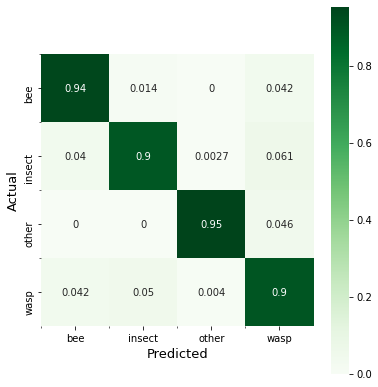

              precision    recall  f1-score   support

         0.0       0.91      0.94      0.93       504
         1.0       0.88      0.90      0.89       376
         2.0       0.97      0.95      0.96       130
         3.0       0.93      0.90      0.92       753

    accuracy                           0.92      1763
   macro avg       0.92      0.92      0.92      1763
weighted avg       0.92      0.92      0.92      1763



In [ ]:
make_classification(svc_linear, 'SVM linear', X_train, y_train, X_test, y_test)

{'C': 0.5}
Normalized confusion matrix


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


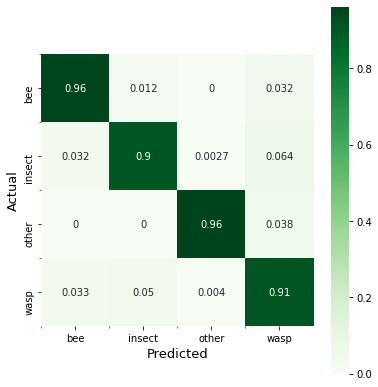

              precision    recall  f1-score   support

         0.0       0.93      0.96      0.94       504
         1.0       0.89      0.90      0.89       376
         2.0       0.97      0.96      0.97       130
         3.0       0.94      0.91      0.93       753

    accuracy                           0.93      1763
   macro avg       0.93      0.93      0.93      1763
weighted avg       0.93      0.93      0.93      1763



(array([3., 0., 3., ..., 3., 3., 0.]), array([3., 0., 3., ..., 3., 3., 0.]))

In [ ]:
make_classification(svc_poly, 'SVM polynomial', X_train, y_train, X_test, y_test)

{'C': 1}
Normalized confusion matrix


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


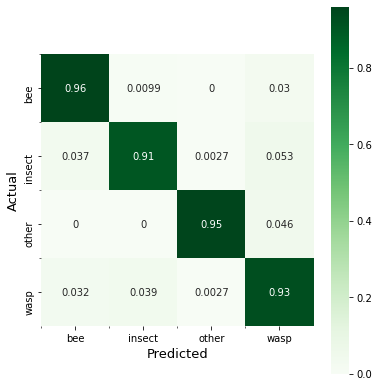

              precision    recall  f1-score   support

         0.0       0.93      0.96      0.94       504
         1.0       0.91      0.91      0.91       376
         2.0       0.98      0.95      0.96       130
         3.0       0.94      0.93      0.94       753

    accuracy                           0.93      1763
   macro avg       0.94      0.94      0.94      1763
weighted avg       0.93      0.93      0.93      1763



In [ ]:
make_classification(svm_expo, 'SVM exponential', X_train, y_train, X_test, y_test)

ZADANIE 2

**a**

In [ ]:
baseModel= MobileNet(weights='imagenet',include_top=False, input_shape=(224,224,3))
for layer in baseModel.layers[0:80]:
  layer.trainable = False

for layer in baseModel.layers[81:]:
  layer.trainable = True
baseModel.summary()

for layer in baseModel.layers:
	print("{}: {}".format(layer, layer.trainable))

headModel = baseModel.output #define 

# GAP the network
headModel = GlobalAveragePooling2D(name = "globalAvgPool2D_1")(headModel) # Flatten(name="flatten")(headModel)
headModel = Dense(256, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(len(classes), activation="softmax")(headModel)

# place the head FC model on top of the base model (this will become
  # the actual model we will train)
model = Model(inputs=baseModel.input, outputs=headModel)
model.summary()

17227776/17225924 [==============================] - 0s 0us/step


In [ ]:
lr = 0.01 #0.1
print("[INFO] compiling model...")
opt = Adam(lr=lr, decay = lr/EPOCHS)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

[INFO] compiling model...


In [ ]:
model_name = 'MobileNet last layer + classification trained'

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

annealer = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=2, verbose=1, min_lr=1e-5)
checkpoint = ModelCheckpoint(model_name + '.h5', verbose=1, save_best_only=True)
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=EPOCHS/5)

In [ ]:
history = model.fit(
    train_gen,
    steps_per_epoch=STEP_SIZE_TRAIN,
    validation_data=valid_gen,
    validation_steps=STEP_SIZE_VALID,
    epochs=EPOCHS,
    callbacks=[annealer,checkpoint,es]
)

Epoch 1/15
124/124 [==============================] - 115s 919ms/step - loss: 1.9047 - accuracy: 0.7496 - val_loss: 0.6025 - val_accuracy: 0.8570

Epoch 00001: val_loss improved from inf to 0.60254, saving model to MobileNet last layer + classification trained.h5
Epoch 2/15
124/124 [==============================] - 114s 919ms/step - loss: 0.3020 - accuracy: 0.8954 - val_loss: 0.3204 - val_accuracy: 0.8864

Epoch 00002: val_loss improved from 0.60254 to 0.32041, saving model to MobileNet last layer + classification trained.h5
Epoch 3/15
124/124 [==============================] - 114s 918ms/step - loss: 0.2843 - accuracy: 0.9009 - val_loss: 0.2794 - val_accuracy: 0.9056

Epoch 00003: val_loss improved from 0.32041 to 0.27937, saving model to MobileNet last layer + classification trained.h5
Epoch 4/15
124/124 [==============================] - 114s 921ms/step - loss: 0.2688 - accuracy: 0.9100 - val_loss: 0.3277 - val_accuracy: 0.8876

Epoch 00004: val_loss did not improve from 0.27937
Ep

In [ ]:
np.save('history_' + model_name + '.npy', history.history)

In [ ]:
# reset the testing generator and evaluate the network after
# fine-tuning just the network head
print("[INFO] evaluating after training last conv block and network head...")

del model

model = load_model(model_name +'.h5')

test_gen.reset()

predIdxs = model.predict(x=test_gen,
	steps=(totalTest // test_gen.batch_size) + 1)
predIdxs = np.argmax(predIdxs, axis=1)

print(classification_report(test_gen.classes, predIdxs,
	target_names=test_gen.class_indices.keys()))

plot_training(history, 9, model_name + '_plot.png')

[INFO] evaluating after training last conv block and network head...


In [ ]:
plot_confusion_matrix(model_name,test_gen,predIdxs)

**b**

In [ ]:
# reset our data generators
train_gen.reset()
valid_gen.reset()
test_gen.reset()
# now that the head FC layers have been trained/initialized, lets
# unfreeze the final set of CONV layers and make them trainable
baseModel_2 = baseModel
for layer in baseModel_2.layers[75:]:
	layer.trainable = True

for layer in baseModel_2.layers[0:74]:
	layer.trainable = False
  
# loop over the layers in the model and show which ones are trainable
# or not
for layer in baseModel_2.layers:
	print("{}: {}".format(layer, layer.trainable))
 
headModel_2 = baseModel_2.output

# fully connecting the network
headModel_2 = GlobalAveragePooling2D(name="GlobalAvgPool_2")(headModel_2)
headModel_2 = Dense(256, activation="relu")(headModel_2)
headModel_2 = Dropout(0.5)(headModel_2)
headModel_2 = Dense(len(train_gen.class_indices.keys()), activation="softmax")(headModel_2)

print(len(train_gen.class_indices.keys()))

# place the head FC model on top of the base model (this will become
  # the actual model we will train)
model_2 = Model(inputs=baseModel_2.input, outputs=headModel_2)

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f0d08c3dd30>: False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f0d08c37080>: False
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f0d08c379e8>: False
<tensorflow.python.keras.layers.advanced_activations.ReLU object at 0x7f0d08da2cf8>: False
<tensorflow.python.keras.layers.convolutional.DepthwiseConv2D object at 0x7f0f2a170828>: False
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f0d08d9d978>: False
<tensorflow.python.keras.layers.advanced_activations.ReLU object at 0x7f0d08bcdda0>: False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f0d08db6400>: False
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f0f2a0d8e48>: False
<tensorflow.python.keras.layers.advanced_activations.ReLU object at 0x7f0d08bddb38>: False
<tensorflow.python.keras.layers.convolutional.ZeroPadding2D object at

In [ ]:
lr = 0.01
print("[INFO] compiling model...")
opt = Adam(lr=lr, decay = lr/EPOCHS)
model_2.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

[INFO] compiling model...


In [ ]:
model_name_2 = 'MobileNet 2 last layers + classification trained'

In [ ]:
annealer_2 = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=2, verbose=1, min_lr=1e-5)
checkpoint_2 = ModelCheckpoint(model_name_2 + '.h5', verbose=1, save_best_only=True)
es_2 = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=EPOCHS/5)

In [ ]:
history_2 = model_2.fit(
    train_gen,
    steps_per_epoch=STEP_SIZE_TRAIN,
    validation_data=valid_gen,
    validation_steps=STEP_SIZE_VALID,
    epochs=EPOCHS,
    callbacks=[annealer_2,checkpoint_2,es_2]
)

Epoch 1/15
124/124 [==============================] - 116s 922ms/step - loss: 0.7246 - accuracy: 0.7856 - val_loss: 5.3709 - val_accuracy: 0.6076

Epoch 00001: val_loss improved from inf to 5.37087, saving model to MobileNet 2 last layers + classification trained.h5
Epoch 2/15
124/124 [==============================] - 114s 917ms/step - loss: 0.3100 - accuracy: 0.8899 - val_loss: 4.2339 - val_accuracy: 0.4567

Epoch 00002: val_loss improved from 5.37087 to 4.23388, saving model to MobileNet 2 last layers + classification trained.h5
Epoch 3/15
124/124 [==============================] - 114s 919ms/step - loss: 0.2800 - accuracy: 0.9059 - val_loss: 0.6956 - val_accuracy: 0.7446

Epoch 00003: val_loss improved from 4.23388 to 0.69565, saving model to MobileNet 2 last layers + classification trained.h5
Epoch 4/15
124/124 [==============================] - 114s 916ms/step - loss: 0.2714 - accuracy: 0.9057 - val_loss: 0.5001 - val_accuracy: 0.8353

Epoch 00004: val_loss improved from 0.69565 

In [ ]:
np.save('history_' + model_name_2 + '.npy', history_2.history)

In [ ]:
# reset the testing generator and evaluate the network after
# fine-tuning just the network head
print("[INFO] evaluating after training last two conv blocks and network head...")

del model_2

model_2 = load_model(model_name_2 +'.h5')
test_gen.reset()
predIdxs_2 = model_2.predict(x=test_gen,
	steps=(totalTest // test_gen.batch_size) + 1)
predIdxs_2 = np.argmax(predIdxs_2, axis=1)
print(classification_report(test_gen.classes, predIdxs_2,
	target_names=test_gen.class_indices.keys()))
plot_training(history_2, 10, model_name_2 + '_plot.png')

[INFO] evaluating after training last two conv blocks and network head...


In [ ]:
plot_confusion_matrix(model_name_2,test_gen,predIdxs_2)

**c**

In [ ]:
# reset our data generators
train_gen.reset()
valid_gen.reset()
test_gen.reset()
# now that the head FC layers have been trained/initialized, lets
# unfreeze the final set of CONV layers and make them trainable
baseModel_3 = baseModel
for layer in baseModel_3.layers:
	layer.trainable = True
# loop over the layers in the model and show which ones are trainable
# or not
for layer in baseModel_3.layers:
	print("{}: {}".format(layer, layer.trainable))
 
headModel_3 = baseModel_3.output

# fully connecting the network
headModel_3 = GlobalAveragePooling2D(name="GlobalAvgPool2D_3")(headModel_3)
headModel_3 = Dense(256, activation="relu")(headModel_3)
headModel_3 = Dropout(0.5)(headModel_3)
headModel_3 = Dense(len(train_gen.class_indices.keys()), activation="softmax")(headModel_3)

# place the head FC model on top of the base model (this will become
  # the actual model we will train)
# del model_3

model_3 = Model(inputs=baseModel_3.input, outputs=headModel_3)

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f53b2b934e0>: True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f53b2b6c7f0>: True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f53b23deb00>: True
<tensorflow.python.keras.layers.advanced_activations.ReLU object at 0x7f53b1ba6ef0>: True
<tensorflow.python.keras.layers.convolutional.DepthwiseConv2D object at 0x7f53b2b93278>: True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f53b07a2b00>: True
<tensorflow.python.keras.layers.advanced_activations.ReLU object at 0x7f53b07acf98>: True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f53b2b936a0>: True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f53b07be2b0>: True
<tensorflow.python.keras.layers.advanced_activations.ReLU object at 0x7f53b07b25c0>: True
<tensorflow.python.keras.layers.convolutional.ZeroPadding2D object at 0x7f53b07

In [ ]:
print("[INFO] compiling model...")
lr = 0.01
opt = Adam(lr=lr, decay = lr/EPOCHS)
model_3.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

[INFO] compiling model...


In [ ]:
model_name_3 = 'MobileNet whole Net (+ classification trained)'

In [ ]:
annealer_3 = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=2, verbose=1, min_lr=1e-5)
checkpoint_3 = ModelCheckpoint(model_name_3 + '.h5', verbose=1, save_best_only=True)
es_3 = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=EPOCHS/5)

In [ ]:
history_3 = model_3.fit(
    train_gen,
    steps_per_epoch=STEP_SIZE_TRAIN,
    validation_data=valid_gen,
    validation_steps=STEP_SIZE_VALID,
    epochs=EPOCHS,
    callbacks=[annealer_3,checkpoint_3,es_3]
)

Epoch 1/15
 91/124 [=====================>........] - ETA: 25:00 - loss: 2.3574 - accuracy: 0.4928

In [ ]:
np.save('history_' + model_name_3 + '.npy', history_3.history)

In [ ]:
# reset the testing generator and evaluate the network after
# fine-tuning just the network head

print("[INFO] evaluating after training whole Net...")
del model_3

model_3 = load_model(model_name_3 +'.h5')
test_gen.reset()
predIdxs_3 = model_3.predict(x=test_gen,
	steps=(totalTest // test_gen.batch_size) + 1)
predIdxs_3 = np.argmax(predIdxs_3, axis=1)
print(classification_report(test_gen.classes, predIdxs_3,
	target_names=test_gen.class_indices.keys()))
plot_training(history_3, 13, model_name_3 + '_plot.png')

[INFO] evaluating after training whole Net...


In [ ]:
plot_confusion_matrix(model_name_3,test_gen,predIdxs_3)

**d) Uproszczenie struktury sieci i jej wytrenowanie.**

In [ ]:
# model.pop()
baseModel_4 = baseModel
# reset our data generators
train_gen.reset()
valid_gen.reset()
test_gen.reset()

# now that the head FC layers have been trained/initialized, lets
for layer in baseModel_4.layers:
	layer.trainable = True

for layer in baseModel_4.layers:
	print("{}: {}".format(layer, layer.trainable))
 
headModel_4 = baseModel_4.layers[-7].output

# fully connecting the network
headModel_4 = GlobalAveragePooling2D(name="globalavgpool_4")(headModel_4)
headModel_4 = Dense(256, activation="relu")(headModel_4)
headModel_4 = Dropout(0.5)(headModel_4)
headModel_4 = Dense(len(train_gen.class_indices.keys()), activation="softmax")(headModel_4)

# place the head FC model on top of the base model (this will become
  # the actual model we will train)
model_4 = Model(inputs=baseModel_4.input, outputs=headModel_4)
model_4.summary()


<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7fe4a6039748>: True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7fe4a6039400>: True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7fe291560f28>: True
<tensorflow.python.keras.layers.advanced_activations.ReLU object at 0x7fe494158390>: True
<tensorflow.python.keras.layers.convolutional.DepthwiseConv2D object at 0x7fe29155bf60>: True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7fe2882f2358>: True
<tensorflow.python.keras.layers.advanced_activations.ReLU object at 0x7fe4a62e3dd8>: True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7fe29154f6a0>: True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7fe29154f240>: True
<tensorflow.python.keras.layers.advanced_activations.ReLU object at 0x7fe29161b4e0>: True
<tensorflow.python.keras.layers.convolutional.ZeroPadding2D object at 0x7fe28f8

In [ ]:
lr = 0.01 #0.1
print("[INFO] compiling model...")
opt = Adam(lr=lr, decay = lr/EPOCHS)
model_4.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

[INFO] compiling model...


In [ ]:
model_name_4 = 'MobileNet simplified - without last conv blocks Net (+ classification trained)'

In [ ]:
annealer_4 = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=2, verbose=1, min_lr=1e-5)
checkpoint_4 = ModelCheckpoint(model_name_4 + '.h5', verbose=1, save_best_only=True)
es_4 = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=EPOCHS/5)

In [ ]:
history_4 = model_4.fit(
    train_gen,
    steps_per_epoch=STEP_SIZE_TRAIN,
    validation_data=valid_gen,
    validation_steps=STEP_SIZE_VALID,
    epochs=EPOCHS,
    callbacks=[annealer_4,checkpoint_4,es_4]
)

NameError: ignored

In [ ]:
np.save('history_' + model_name_4 + '.npy', history_4.history)

In [ ]:
print("[INFO] evaluating after training whole Net...")
del model_4
model_4 = load_model(model_name_4 +'.h5')
test_gen.reset()
predIdxs_4 = model_4.predict(x=test_gen,
	steps=(totalTest // test_gen.batch_size) + 1)
predIdxs_4 = np.argmax(predIdxs_4, axis=1)
print(classification_report(test_gen.classes, predIdxs_4,
	target_names=test_gen.class_indices.keys()))
plot_training(history_4, 9, model_name_4 + '_plot.png')

[INFO] evaluating after training whole Net...


In [ ]:
plot_confusion_matrix()

ZADANIE 3.1

In [ ]:
pip install keract

In [ ]:
def preprocess_image(img_path, model=None, rescale=255, resize=(256, 256)):
    """
    Preprocesses a given image for prediction with a trained model, with rescaling and resizing options
    
    Arguments:
            img_path: The path to the image file
            rescale: A float or integer indicating required rescaling. 
                    The image array will be divided (scaled) by this number.
            resize: A tuple indicating desired target size. 
                    This should match the input shape as expected by the model
    Returns:
            img: A processed image.
    """
    from keras.preprocessing.image import img_to_array, load_img
    import cv2
    import numpy as np

    assert type(img_path) == str, "Image path must be a string"
    assert (
        type(rescale) == int or type(rescale) == float
    ), "Rescale factor must be either a float or int"
    assert (
        type(resize) == tuple and len(resize) == 2
    ), "Resize target must be a tuple with two elements"

    img = load_img(img_path)
    img = img_to_array(img)
    img = img / float(rescale)
    img = cv2.resize(img, resize)
    if model != None:
        if len(model.input_shape) == 4:
            img = np.expand_dims(img, axis=0)

    return img

Activation maps dla ostatniego bloku splotowego i części klasyfikującej.

In [ ]:
from keract import display_activations
# The image path
img_path = "wasp2/W00509.jpg"
# Preprocessing the image for the model
x = preprocess_image(img_path=img_path,model=model,resize=(224,224))

from keract import get_activations
# Generate the activations 
activations = get_activations(model, x)

In [ ]:
display_activations(activations, save=False)

In [ ]:
from keract import display_heatmaps

display_heatmaps(activations, x, save=False)

In [ ]:
def get_activation_map(image_path, image_class_vector, loaded_model, final_conv_layer): 
        from tensorflow.keras.applications.mobilenet import preprocess_input
        import PIL, cv2
        import matplotlib.image as mpimg
        import matplotlib.pyplot as plt       
        img_size =224
        image_loaded = PIL.Image.open(image_path)
        image_loaded = image_loaded.resize((img_size, img_size))
        image_loaded = np.asarray(image_loaded)
      
        if len(image_loaded.shape) < 3:
          image_loaded = np.stack([image_loaded.copy()] * 3, axis=2)
        
        preprocessed_image = preprocess_input(image_loaded)
        # preprocessed_image = image_loaded
        preprocessed_image = np.expand_dims(preprocessed_image, axis=0)
        
        image_class = np.argmax(image_class_vector)

        class_weights = loaded_model.layers[-1].get_weights()[0]
        # final_conv_layer = loaded_model.layers[-3]
        
        get_output = tf.keras.backend.function([loaded_model.layers[0].input], 
                                               [final_conv_layer.output, loaded_model.layers[-1].output])
        
        [conv_outputs, predictions] = get_output(preprocessed_image)
        conv_outputs = conv_outputs[0, :, :, :]

        cam = np.zeros(dtype=np.float32, shape=conv_outputs.shape[0:2])

        for index, weight in enumerate(class_weights[:, image_class]):
          cam += weight * conv_outputs[:, :, index]
        
        class_predicted = np.argmax(predictions[0])
        predictions = f'Class predicted: {class_predicted} | Real class: {image_class}'
        
        cam /= np.max(cam)
        cam = cv2.resize(cam, (img_size, img_size))
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        heatmap[np.where(cam < 0.2)] = 0
        
        img = heatmap * 0.5 + image_loaded
        cv2.imwrite("heatmap.jpg", img)
        
        heatmap = mpimg.imread("heatmap.jpg")
        
        scaled_image = (((img - img.min()) * 255) / (img.max() - img.min())).astype(np.uint8)

        cv2.imread(/complete/path/to/image,flag)
        
        

        fig, ax = plt.subplots(1, 2, figsize=(10, 10))
        ax[0].imshow(image_loaded)

        ax[0].set_title('Original image')

        ax[1].imshow(heatmap)
        ax[1].set_title(predictions)


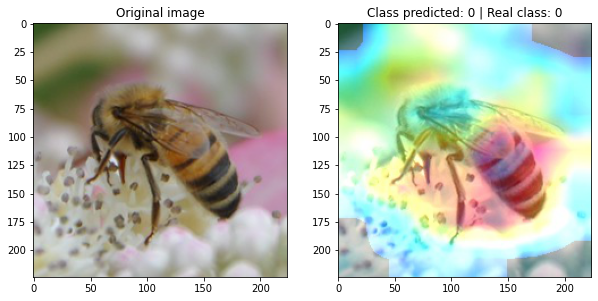

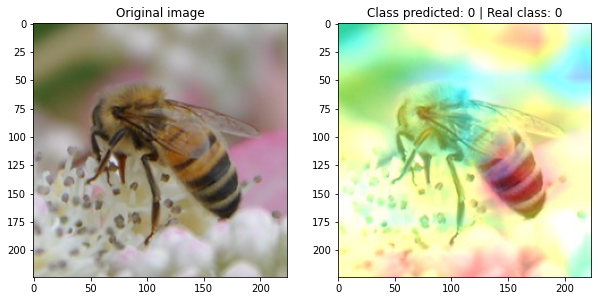

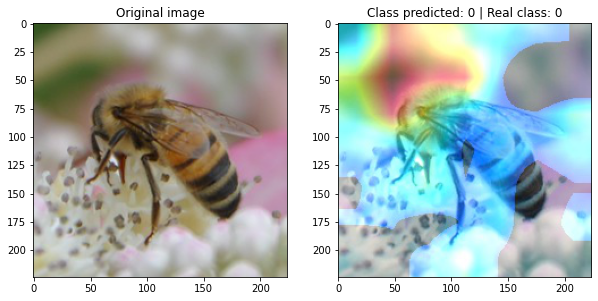

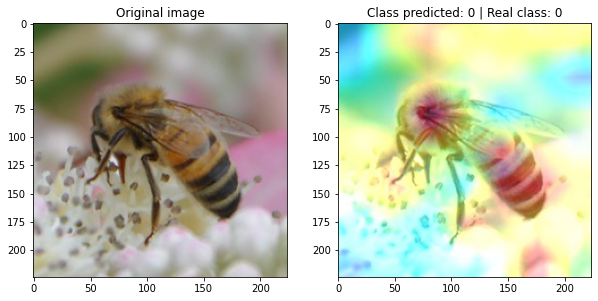

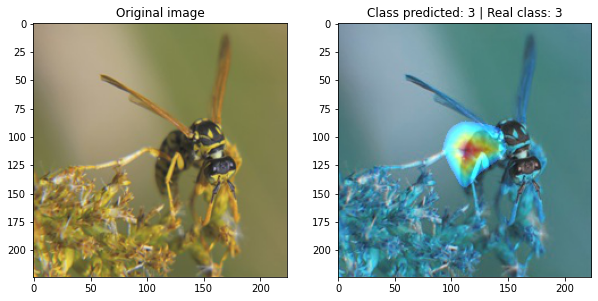

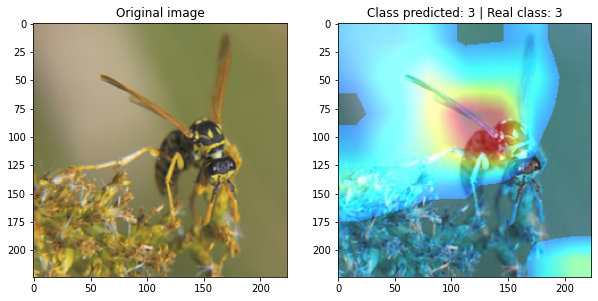

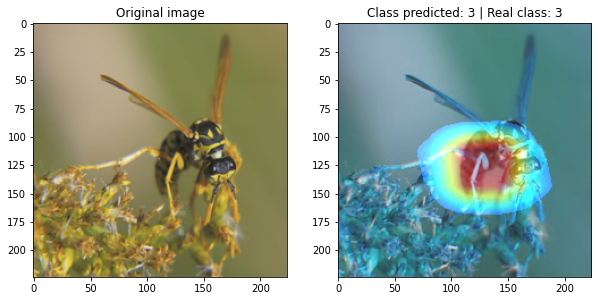

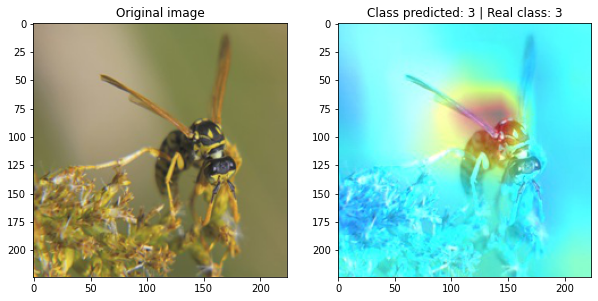

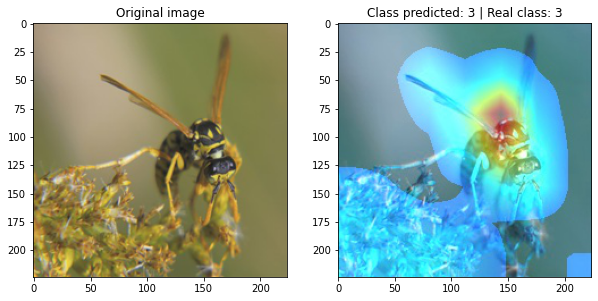

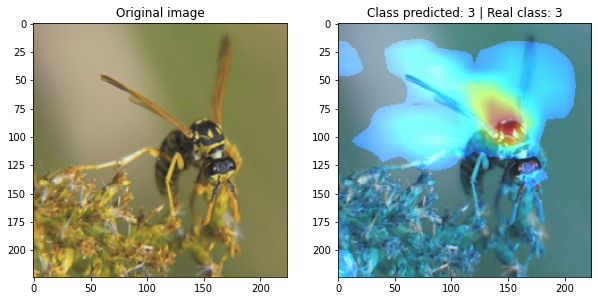

In [ ]:
layer_final_relu = model_0.get_layer('conv_pw_13_relu')
layer_final_relu_4 = model_4.get_layer('conv_pw_12_relu')
 
get_activation_map("bee1/9430277333_d6e3cf76d2_m.jpg", [1,0,0,0], model_0, model_0.get_layer('conv_pw_13_relu')) #layers[-5])
get_activation_map("bee1/9430277333_d6e3cf76d2_m.jpg", [1,0,0,0], model_0, model_0.get_layer('conv_pw_12_relu')) #layers[-5])

get_activation_map("bee1/9430277333_d6e3cf76d2_m.jpg", [1,0,0,0], model, model.get_layer('conv_pw_13_relu')) #layers[-5])
get_activation_map("bee1/9430277333_d6e3cf76d2_m.jpg", [1,0,0,0], model, model.get_layer('conv_pw_12_relu')) #layers[-5])

get_activation_map("wasp1/9982947853_6a7a859cd6_n.jpg", [0,0,0,1], model_2, model_2.get_layer('conv_pw_13_relu')) #layers[-5])
get_activation_map("wasp1/9982947853_6a7a859cd6_n.jpg", [0,0,0,1], model_2, model_2.get_layer('conv_pw_12_relu')) #layers[-5])

get_activation_map("wasp1/9982947853_6a7a859cd6_n.jpg", [0,0,0,1], model_3, model_3.get_layer('conv_pw_13_relu')) #layers[-5])
get_activation_map("wasp1/9982947853_6a7a859cd6_n.jpg", [0,0,0,1], model_3, model_3.get_layer('conv_pw_12_relu')) #layers[-5])

get_activation_map("wasp1/9982947853_6a7a859cd6_n.jpg", [0,0,0,1], model_4, model_4.get_layer('conv_pw_12_relu')) #layers[-5])
get_activation_map("wasp1/9982947853_6a7a859cd6_n.jpg", [0,0,0,1], model_4, model_4.get_layer('conv_pw_11_relu')) #layers[-5])



# get_activation_map("wasp2/W00509.jpg", [0,0,0,1], model_0, layer_final_relu)
# get_activation_map("bee2/P9755-119r.jpg", [1,0,0,0], model_0, layer_final_relu)

# model_4.summary()
# get_activation_map("wasp2/W00509.jpg", [0,0,0,1], model_4, layer_final_relu_4)



ZADANIE 3.2

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import mobilenet

base_image_path = "wasp1/9982947853_6a7a859cd6_n.jpg"
result_prefix = "wasp"

# These are the names of the layers
# for which we try to maximize activation,
# as well as their weight in the final loss
# we try to maximize.
layer_settings = {
    "conv_pw_10": 1.0,
    "conv_pw_11": 1.5,
    "conv_pw_12": 2.0,
    "conv_pw_13": 2.5,
}

step = 0.03  # Gradient ascent step size
num_octave = 1  # Number of scales at which to run gradient ascent
octave_scale = 1.4  # Size ratio between scales
iterations = 50  # Number of ascent steps per scale
max_loss = 30.0

In [ ]:
def preprocess_image(image_path):
    # Util function to open, resize and format pictures
    # into appropriate arrays.
    img = keras.preprocessing.image.load_img(image_path)
    img = keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = mobilenet.preprocess_input(img)
    return img


def deprocess_image(x):
    # Util function to convert a NumPy array into a valid image.
    x = x.reshape((x.shape[1], x.shape[2], 3))
    # Undo preprocessing
    x /= 2.0
    x += 0.5
    x *= 255.0
    # Convert to uint8 and clip to the valid range [0, 255]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

In [ ]:
outputs_dict = dict(
    [
        (layer.name, layer.output)
        for layer in [model_0.get_layer(name) for name in layer_settings.keys()]
    ]
)
feature_extractor = keras.Model(inputs=model_0.inputs, outputs=outputs_dict)

In [ ]:
def compute_loss(input_image):
    features = feature_extractor(input_image)
    # Initialize the loss
    loss = tf.zeros(shape=())
    for name in features.keys():
        coeff = layer_settings[name]
        activation = features[name]
        # We avoid border artifacts by only involving non-border pixels in the loss.
        scaling = tf.reduce_prod(tf.cast(tf.shape(activation), "float32"))
        loss += coeff * tf.reduce_sum(tf.square(activation[:, 2:-2, 2:-2, :])) / scaling
    return loss

In [ ]:
@tf.function
def gradient_ascent_step(img, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img)
    # Compute gradients.
    grads = tape.gradient(loss, img)
    # Normalize gradients.
    grads /= tf.maximum(tf.reduce_mean(tf.abs(grads)), 1e-6)
    img += learning_rate * grads
    return loss, img


def gradient_ascent_loop(img, iterations, learning_rate, max_loss=None):
    for i in range(iterations):
        loss, img = gradient_ascent_step(img, learning_rate)
        if max_loss is not None and loss > max_loss:
            break
        print("... Loss value at step %d: %.2f" % (i, loss))
    return img

(224, 224)
Processing octave 0 with shape (224, 224)
... Loss value at step 0: 5.40
... Loss value at step 1: 5.62
... Loss value at step 2: 6.18
... Loss value at step 3: 6.41
... Loss value at step 4: 6.98
... Loss value at step 5: 7.26
... Loss value at step 6: 7.65
... Loss value at step 7: 7.94
... Loss value at step 8: 8.17
... Loss value at step 9: 8.53
... Loss value at step 10: 8.62
... Loss value at step 11: 8.89
... Loss value at step 12: 9.10
... Loss value at step 13: 9.36
... Loss value at step 14: 9.55
... Loss value at step 15: 9.74
... Loss value at step 16: 10.04
... Loss value at step 17: 10.04
... Loss value at step 18: 10.26
... Loss value at step 19: 10.40
... Loss value at step 20: 10.79
... Loss value at step 21: 10.83
... Loss value at step 22: 10.97
... Loss value at step 23: 10.91
... Loss value at step 24: 11.20
... Loss value at step 25: 11.23
... Loss value at step 26: 11.41
... Loss value at step 27: 11.50
... Loss value at step 28: 11.71
... Loss value a

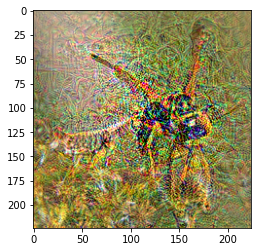

In [ ]:
import cv2
original_img = preprocess_image(base_image_path)
original_img = tf.image.resize(original_img, (224,224))
original_shape = original_img.shape[1:3]
print(original_shape)

successive_shapes = [original_shape]
for i in range(1, num_octave):
    shape = tuple([int(dim / (octave_scale ** i)) for dim in original_shape])
    successive_shapes.append(shape)
successive_shapes = successive_shapes[::-1]
shrunk_original_img = tf.image.resize(original_img, successive_shapes[0])

img = tf.identity(original_img)

for i, shape in enumerate(successive_shapes):
    print("Processing octave %d with shape %s" % (i, shape))
    # img = tf.image.resize(img, shape)
    img = gradient_ascent_loop(
        img, iterations=iterations, learning_rate=step, max_loss=max_loss
    )
    upscaled_shrunk_original_img = tf.image.resize(shrunk_original_img, shape)
    same_size_original = tf.image.resize(original_img, shape)
    lost_detail = same_size_original - upscaled_shrunk_original_img

    img += lost_detail
    shrunk_original_img = tf.image.resize(original_img, shape)

import matplotlib.pyplot as plt

plt.imshow(deprocess_image(img.numpy()))
#keras.preprocessing.image.save_img(result_prefix + ".png", deprocess_image(img.numpy()))
#from IPython.display import Image, display

#display(Image(result_prefix + ".png"))


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

# The dimensions of our input image
img_width = 224
img_height = 224
# Our target layer: we will visualize the filters from this layer.
# See `model.summary()` for list of layer names, if you want to change this.
layer_name = "conv_pw_6"

#model = keras.applications.ResNet50V2(weights="imagenet", include_top=False)

# Set up a model that returns the activation values for our target layer
layer = model_0.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model_0.inputs, outputs=layer.output)

In [ ]:
def compute_loss(input_image, filter_index):
    activation = feature_extractor(input_image)
    # We avoid border artifacts by only involving non-border pixels in the loss.
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

@tf.function
def gradient_ascent_step(img, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img, filter_index)
    # Compute gradients.
    grads = tape.gradient(loss, img)
    # Normalize gradients.
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    return loss, img

def initialize_image():
    # We start from a gray image with some random noise
    img = tf.random.uniform((1, img_width, img_height, 3))
    # Here we scale our random inputs to [-0.125, +0.125]
    return (img - 0.5) * 0.25


def visualize_filter(filter_index):
    # We run gradient ascent for 20 steps
    iterations = 30
    learning_rate = 10.0
    img = initialize_image()
    for iteration in range(iterations):
        loss, img = gradient_ascent_step(img, filter_index, learning_rate)

    # Decode the resulting input image
    img = deprocess_image(img[0].numpy())
    return loss, img


def deprocess_image(img):
    # Normalize array: center on 0., ensure variance is 0.15
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.15

    # Center crop
    img = img[25:-25, 25:-25, :]

    # Clip to [0, 1]
    img += 0.5
    img = np.clip(img, 0, 1)

    # Convert to RGB array
    img *= 255
    img = np.clip(img, 0, 255).astype("uint8")
    return img

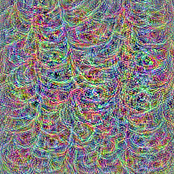

In [ ]:
from IPython.display import Image, display

loss, img = visualize_filter(0)
keras.preprocessing.image.save_img("0.png", img)
display(Image("0.png"))

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23
Processing filter 24
Processing filter 25
Processing filter 26
Processing filter 27
Processing filter 28
Processing filter 29
Processing filter 30
Processing filter 31
Processing filter 32
Processing filter 33
Processing filter 34
Processing filter 35
Processing filter 36
Processing filter 37
Processing filter 38
Processing filter 39
Processing filter 40
Processing filter 41
Processing filter 42
Processing filter 43
Processing filter 44
Processing filter 45
Processing filter 46
Processing filter 47
Pr

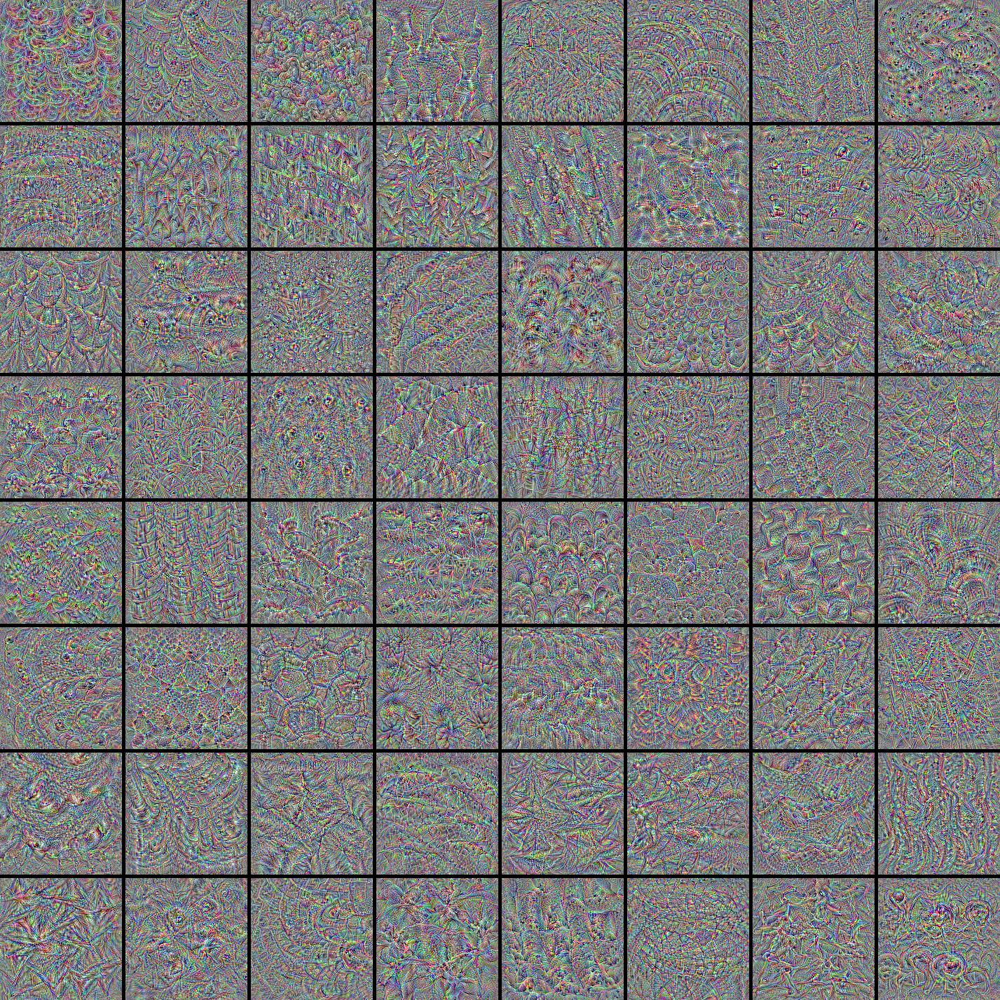

In [ ]:
# Compute image inputs that maximize per-filter activations
# for the first 64 filters of our target layer
all_imgs = []
for filter_index in range(64):
    print("Processing filter %d" % (filter_index,))
    loss, img = visualize_filter(filter_index)
    all_imgs.append(img)

# Build a black picture with enough space for
# our 8 x 8 filters of size 128 x 128, with a 5px margin in between
margin = 5
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

# Fill the picture with our saved filters
for i in range(n):
    for j in range(n):
        img = all_imgs[i * n + j]
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = img
keras.preprocessing.image.save_img("stiched_filters_6.png", stitched_filters)

from IPython.display import Image, display

display(Image("stiched_filters_6.png"))